In [1]:
d = 'C:/kaggle_data/tabular/2021_5'

In [11]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from catboost import Pool, CatBoostClassifier
import lightgbm
import xgboost

In [3]:
train = pd.read_csv(d+'/train.csv')
test = pd.read_csv(d+'/test.csv')
ss = pd.read_csv(d+'/sample_submission.csv')
train.drop('id',1, inplace=True)
test.drop('id',1, inplace=True)

([<matplotlib.patches.Wedge at 0x22e643b3c88>,
 [Text(-0.2590226517578658, 1.079355023093108, 'Class_2'),
  Text(-0.45951247376682447, -1.0104198565213838, 'Class_3'),
  Text(0.6644290521987817, -0.8891760425215182, 'Class_4'),
  Text(1.07075071304321, -0.29256266083944704, 'Class_1')])

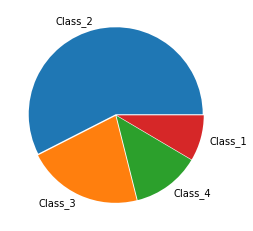

In [4]:
plt.pie(train['target'].value_counts().values, explode = [0.01, 0.01,0.01,0.01], labels = train['target'].value_counts().index)

In [5]:
for c in train.columns:
    print('#'*30)
    print(f'{c}의 level 수는', len(train[c].unique()))
    print(train[c].unique())
    print()

##############################
feature_0의 level 수는 11
[ 0  1  9  2  3  4  7  5  6  8 10]

##############################
feature_1의 level 수는 31
[ 0  1  6  2  7  3 19 12 15  5  4 14 22 18 11  8 21 10  9 26 13 17 27 16
 20 25 23 24 29 28 31]

##############################
feature_2의 level 수는 7
[1 0 3 2 4 5 6]

##############################
feature_3의 level 수는 26
[ 0  1  2  7  3  9 12  4  6  8  5 10 11 19 15 14 16 17 13 22 20 18 23 21
 24 26]

##############################
feature_4의 level 수는 38
[ 1  2  0 14  4 17 10  7 11 16  3  8 18 21 30 12  6 13 15 19 20 29 22  9
  5 24 25 28 33 23 26 32 27 31 35 34 38 37]

##############################
feature_5의 level 수는 11
[ 0  1  2  3  8  5  7  4  6  9 10]

##############################
feature_6의 level 수는 28
[ 0  3  2  7  1 10  9  5 11  6  8  4 12 19 15 18 13 14 24 16 17 21 25 22
 23 20 27 26]

##############################
feature_7의 level 수는 32
[ 0  3 13  1  5  2  4  7 10  8 14 11 17  9  6 15 16 22 12 20 19 18 21 23
 27 28 25 26 24 29 30 

In [16]:
train.nunique()

feature_0     11
feature_1     31
feature_2      7
feature_3     26
feature_4     38
feature_5     11
feature_6     28
feature_7     32
feature_8     37
feature_9     18
feature_10    17
feature_11    13
feature_12    12
feature_13     4
feature_14    52
feature_15    21
feature_16    20
feature_17    17
feature_18    14
feature_19    58
feature_20    18
feature_21    36
feature_22     5
feature_23    20
feature_24    35
feature_25    23
feature_26    22
feature_27    32
feature_28    24
feature_29    14
feature_30    43
feature_31    46
feature_32    30
feature_33    25
feature_34    26
feature_35    44
feature_36     4
feature_37    15
feature_38    71
feature_39    70
feature_40    22
feature_41    31
feature_42    40
feature_43    33
feature_44    10
feature_45    27
feature_46    30
feature_47    26
feature_48    45
feature_49    21
target         4
dtype: int64

In [4]:
cat_features = ['feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14',
       'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_29',
       'feature_30', 'feature_31', 'feature_32', 'feature_33', 'feature_34',
       'feature_35', 'feature_36', 'feature_37', 'feature_38', 'feature_39',
       'feature_40', 'feature_41', 'feature_42', 'feature_43', 'feature_44',
       'feature_45', 'feature_46', 'feature_47', 'feature_48', 'feature_49']

In [5]:
def enc(x):
    if x == 'Class_1':
        return 0
    elif x == 'Class_2':
        return 1
    elif x == 'Class_3':
        return 2
    elif x == 'Class_4':
        return 3

In [6]:
train['target'] = train['target'].apply(enc)

In [8]:
train.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,target
0,0,0,1,0,1,0,0,0,0,0,...,0,0,21,0,0,0,0,0,0,1
1,0,0,0,0,2,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,2,...,0,1,0,0,0,0,13,2,0,0
3,0,0,0,0,0,0,0,3,0,0,...,0,0,0,0,0,0,0,1,0,3
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1


<AxesSubplot:>

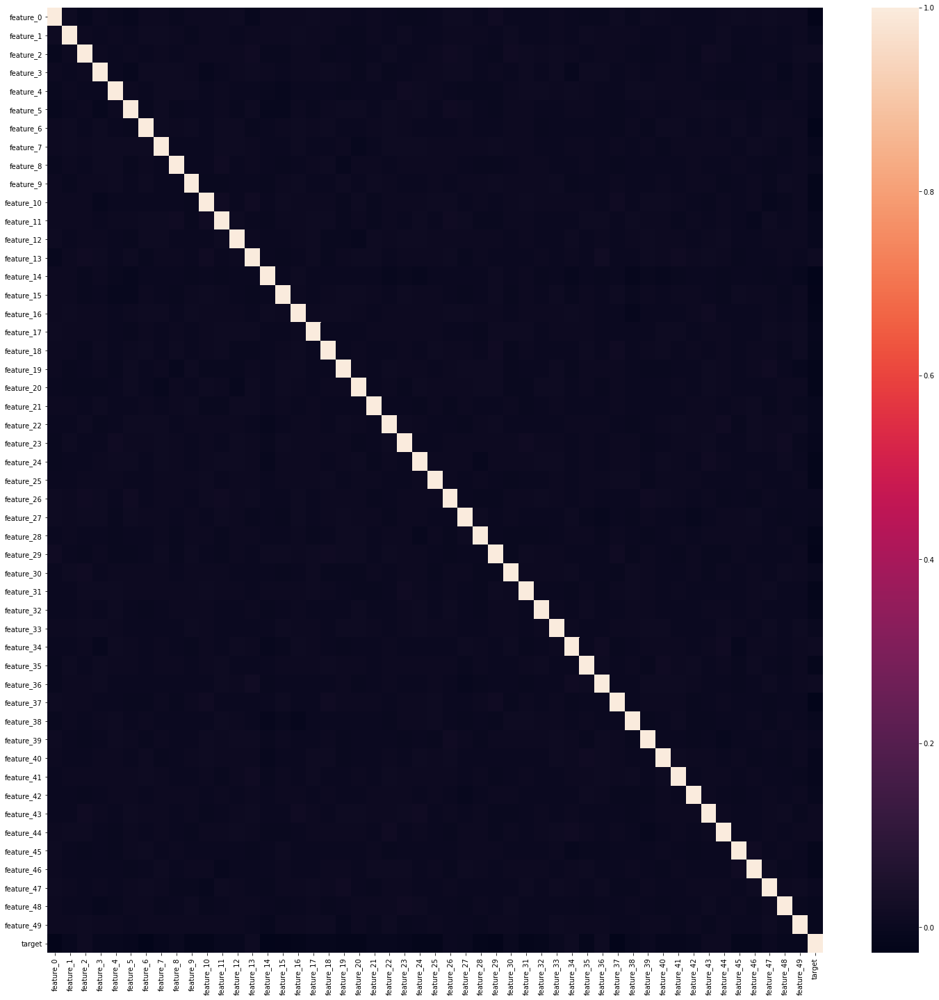

In [25]:
plt.figure(figsize=(25,25))
plt.gca()
sns.heatmap(train.corr())

<AxesSubplot:xlabel='feature_0', ylabel='Count'>

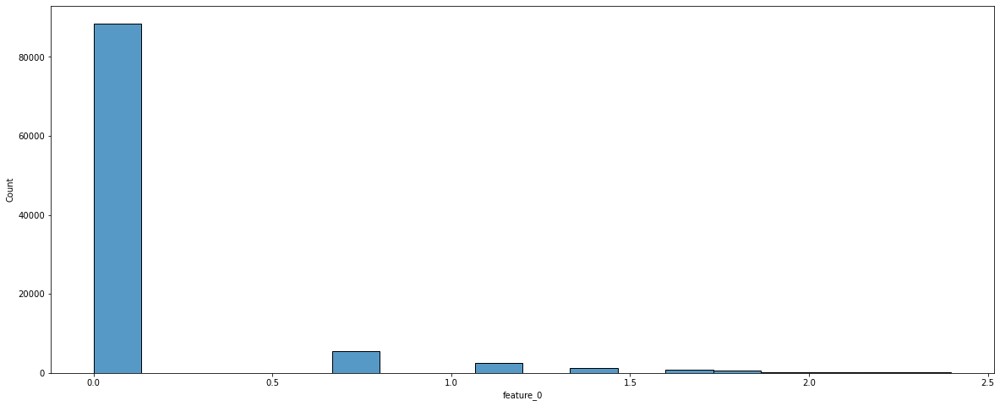

In [55]:
fig = plt.figure(figsize=(20,8))
sns.histplot(train['feature_0'])

<AxesSubplot:xlabel='feature_1', ylabel='Count'>

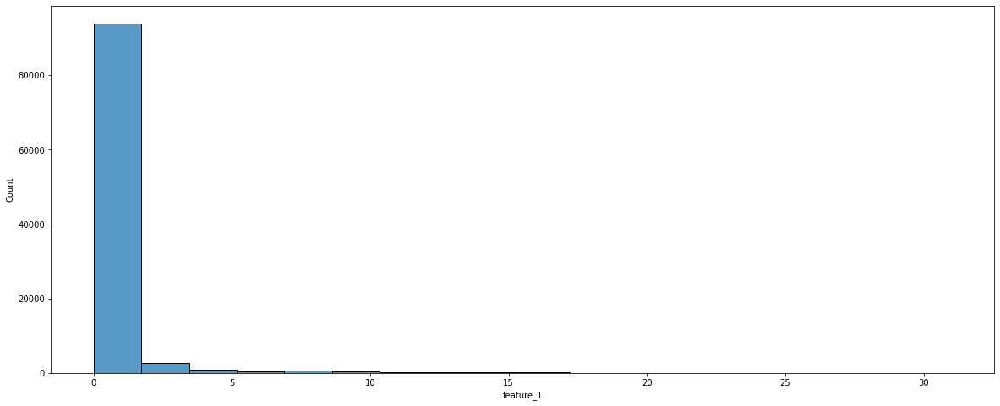

In [57]:
fig = plt.figure(figsize=(20,8))
sns.histplot((train['feature_1']))

<AxesSubplot:xlabel='feature_2', ylabel='Count'>

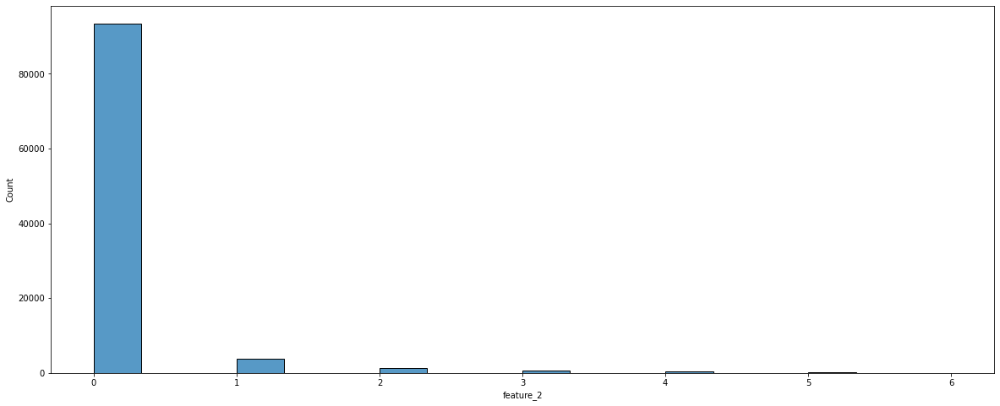

In [58]:
fig = plt.figure(figsize=(20,8))
sns.histplot((train['feature_2']))

In [64]:
sns.pairplot(train)

In [8]:
lgbm_params = {
        "boosting": 'gbdt',
        "objective" : "multiclass",
        "metric" : "multi_logloss", 
        "num_classes" : 4,
        "n_estimators": 1000,
        "seed":42}

In [37]:
total_s = time.time()


n = 7

X = train.drop('target',1)
y = train['target']
skf = StratifiedKFold(n_splits=n, shuffle=True, random_state=1123)
loss = 0
preds = np.zeros((len(test),4))
for fold , (train_idx, valid_idx) in enumerate(skf.split(X, y)):
    print(f'{fold+1}번째 폴드 학습 시작')
    X_train, X_valid = X.iloc[train_idx], X.iloc[valid_idx]
    y_train, y_valid = y[train_idx], y[valid_idx]
    
    print('catboost 학습 시작')
    start = time.time()
    cat_train = Pool(data = X_train,
                        label = y_train,
                        cat_features=cat_features)
#     cat_valid = Pool(data = X_valid,
#                         label = y_valid,
#                         cat_features=cat_features)
    
    
    
    cat_model = CatBoostClassifier(iterations=1000,loss_function='MultiClass')
    cat_model.fit(cat_train, 
                  verbose=False,
                    early_stopping_rounds=100,
                    eval_set=[(X_valid, y_valid)],
                    use_best_model=True)
    loss += log_loss(pd.get_dummies(y_valid),cat_model.predict_proba(X_valid))/(n*3)
    preds += cat_model.predict_proba(test)/(n*3)
    end = time.time()
    m = time.gmtime(end-start).tm_min
    s = time.gmtime(end-start).tm_sec
    print(f'학습 소요 시간:{m}분 {s}초')
    print()
    
    
    print('lgbm 학습 시작')
    start = time.time()

    lgtrain = lightgbm.Dataset(X_train, y_train, categorical_feature=cat_features)
    lgeval = lightgbm.Dataset(X_valid,y_valid, categorical_feature=cat_features)
    
    lgbm_model = lightgbm.train(params=lgbm_params,
                    categorical_feature = cat_features,
                   train_set=lgtrain,
                   valid_sets=lgeval,
                    verbose_eval=1000,
                    early_stopping_rounds=100)
    
    loss += log_loss(pd.get_dummies(y_valid),lgbm_model.predict(X_valid))/(n*3)
    preds += lgbm_model.predict(test)/(n*3)
    end = time.time()
    m = time.gmtime(end-start).tm_min
    s = time.gmtime(end-start).tm_sec
    print(f'학습 소요 시간:{m}분 {s}초')
    print()
    
    
    
    
    
    
    print('xgb 학습 시작')
    xgb_model =  xgboost.XGBClassifier(n_estimators=1000)
    xgb_model.fit(X_train,y_train,
             eval_set=[(X_valid, y_valid)],
             eval_metric='mlogloss',
             early_stopping_rounds=100)
    
    loss += log_loss(pd.get_dummies(y_valid),xgb_model.predict_proba(X_valid))/(n*3)
    preds += xgb_model.predict_proba(test)/(n*3)
    end = time.time()
    m = time.gmtime(end-start).tm_min
    s = time.gmtime(end-start).tm_sec
    print(f'학습 소요 시간:{m}분 {s}초')
    print()
    
    
    
    
print(loss/(n*3))

ttime = (time.time() - total_s)
tm = ttime.tm_min
ts = ttime.tm_sec
print(f'학습 소요 시간:{tm}분 {ts}초')

1번째 폴드 학습 시작
catboost 학습 시작


KeyboardInterrupt: 

In [29]:
ss.iloc[:,1:] = preds

In [35]:
sum(preds[0])

0.9999999998059744

In [36]:
ss.to_csv('15folds_cat_lgbm_xgb.csv',index=False)